In [1]:
import numpy as np
import cv2 
import matplotlib.pyplot as plt
import glob

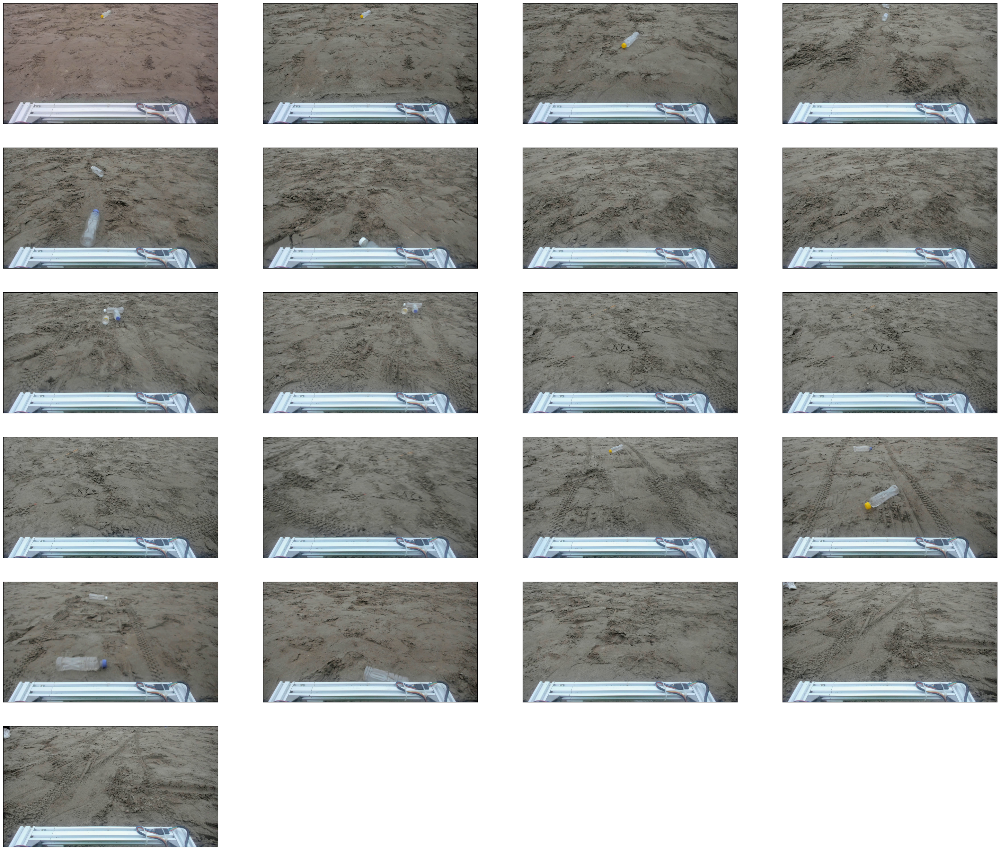

In [2]:
cv_img = []
samp=21
x=7
y=4

alpha=0.5
beta=10
for img in glob.glob("*.jpg"):
    n= cv2.imread(img)
    n=cv2.cvtColor(n, cv2.COLOR_BGR2RGB)
    #n=cv2.convertScaleAbs(n, alpha=alpha, beta=beta)
    # n=cv2.resize(n,(1200,700))
    cv_img.append(n)


plt.figure(figsize=(40,40))
for i in range(samp):
    plt.subplot(x,y,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv_img[i],cmap='gray')
plt.show()

In [6]:
def crop_mask(file):
    height = 880
    top=400
    polygons = np.array([[(250, height), (1500, height), (1200,top),(400, top)]])
    roi = np.zeros_like(file)
    cv2.fillPoly(roi, polygons, 255)
    mask_roi=cv2.bitwise_and(file, roi)
    return  mask_roi

In [11]:
def process(img,kernel=35,th=140,kernel2=3,iter=3):
    gray=cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    gauss_filter = cv2.GaussianBlur(gray,(kernel,kernel),5)
    crop=crop_mask(gauss_filter)
    ret,bw = cv2.threshold(crop, th, 255, cv2.THRESH_BINARY)
    k=np.ones((kernel2, kernel2), np.uint8)
    erode = cv2.erode(bw, k, iterations=iter) 
    return erode

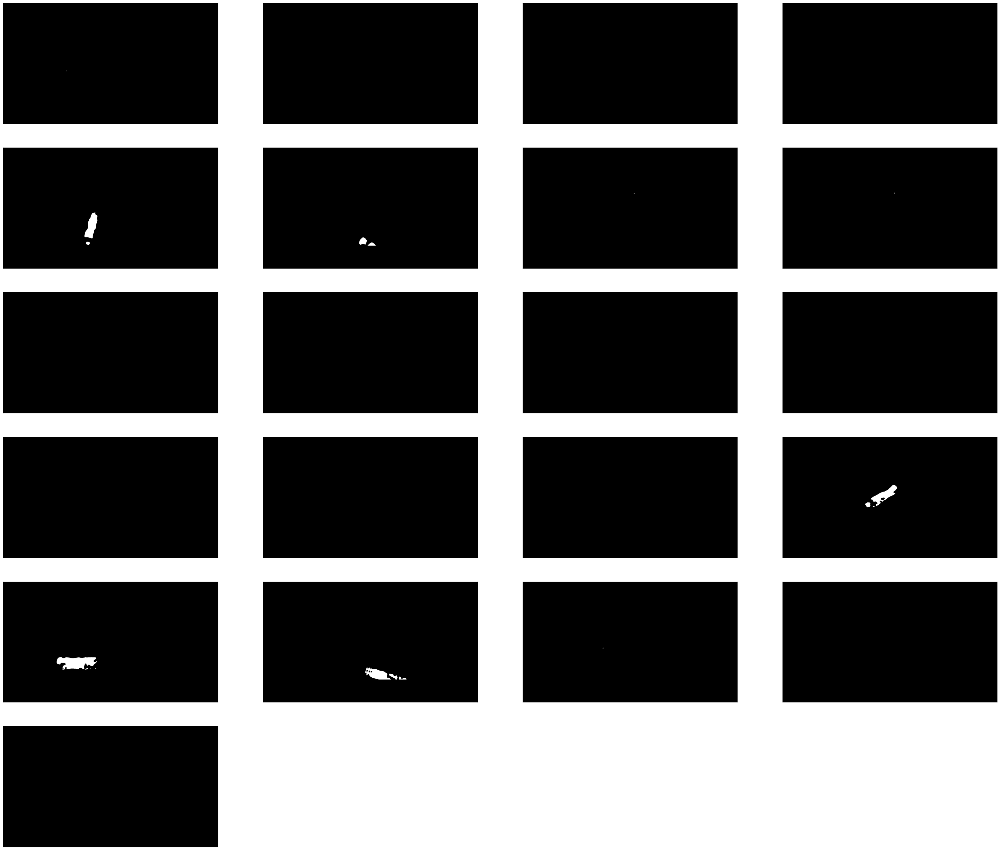

In [12]:
mask=[]
for i in range(samp):
    n=cv_img[i].copy()
    n=process(n)
    mask.append(n)


plt.figure(figsize=(40,40))
for i in range(samp):
    plt.subplot(x,y,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(mask[i],cmap='gray')
plt.show()